In [1]:
import pandas as pd
from neighbor_balance.plotting import ContactMap, format_ticks, parse_region, load_bw, bin_track, apply_matplotlib_style, stylize_gene_name
from neighbor_balance.neighbor import normalize_contact_map_average
import bioframe
import cooler
import cooltools
import matplotlib.pyplot as plt
from matplotlib import gridspec
import numpy as np
from scipy.stats import spearmanr

apply_matplotlib_style()

regions = {
    'ppm1g': 'chr5:31,250,000-32,400,000',
    'nanog': 'chr6:122,430,000-122,900,000',
    'sox2': 'chr3:33,600,000-35,800,000',
    'fbn2': 'chr18:58,032,000-59,034,000',
    'klf1': 'chr8:84,800,000-85,900,000',
}

supercloud = '/home/joepaggi/share'
size = 25_600
genome_wide_cool = f'{supercloud}/microc/hsieh/GSE130275_mESC_WT/GSE130275_mESC_WT_minus_inward.mcool'

INFO:root:Iteration: 0, Mean: 3.99e+02, Stddev: 7.79e+01
INFO:root:Capping 0 non-diagonal contact probabilities to 10.0.
/tmp/ipykernel_1798300/3350520231.py:24: RuntimeWarning: invalid value encountered in divide
  ax.plot(np.nansum(region_mat, axis=1) / np.nansum(mat, axis=1))
/tmp/ipykernel_1798300/3350520231.py:51: RuntimeWarning: invalid value encountered in divide
  ax.plot(np.nansum(mat, axis=1) / np.nansum(region_mat, axis=1))


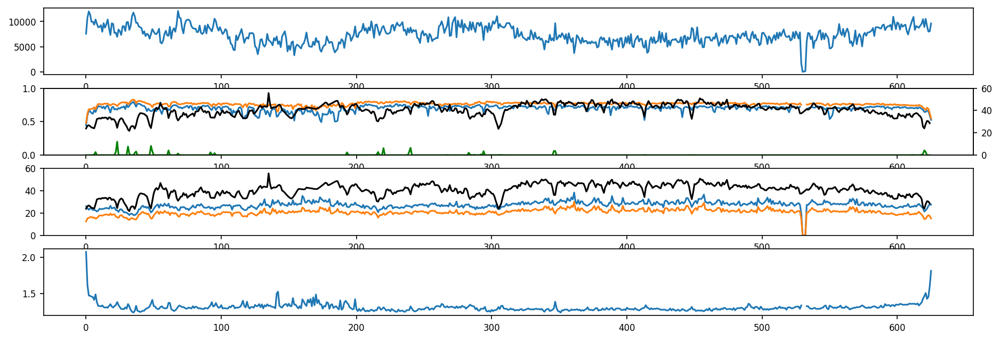

INFO:root:Iteration: 0, Mean: 3.95e+02, Stddev: 7.92e+01
INFO:root:Capping 0 non-diagonal contact probabilities to 10.0.


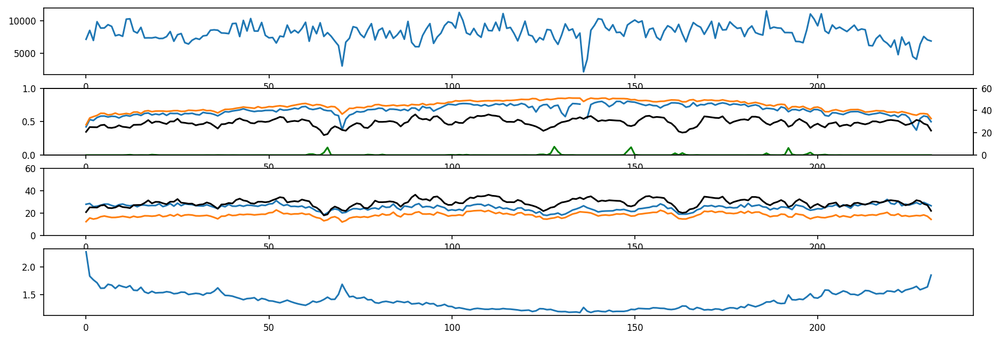

INFO:root:Iteration: 0, Mean: 1.43e+02, Stddev: 2.68e+01
INFO:root:Capping 0 non-diagonal contact probabilities to 10.0.
/tmp/ipykernel_1798300/3350520231.py:24: RuntimeWarning: invalid value encountered in divide
  ax.plot(np.nansum(region_mat, axis=1) / np.nansum(mat, axis=1))
/tmp/ipykernel_1798300/3350520231.py:51: RuntimeWarning: invalid value encountered in divide
  ax.plot(np.nansum(mat, axis=1) / np.nansum(region_mat, axis=1))


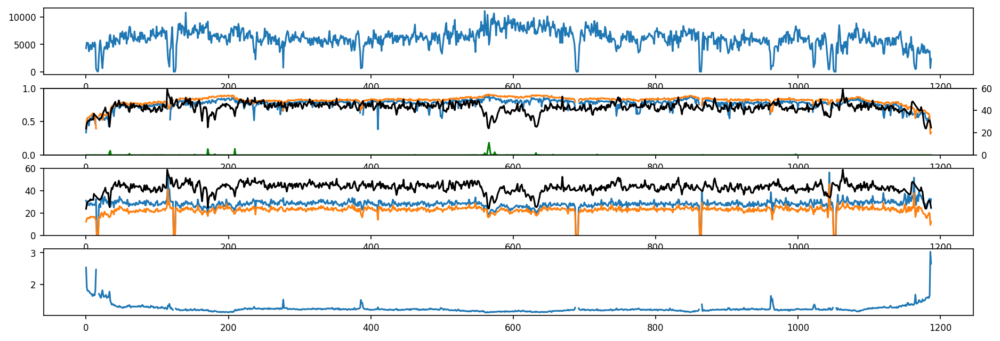

INFO:root:Iteration: 0, Mean: 9.16e+01, Stddev: 1.23e+01
INFO:root:Capping 0 non-diagonal contact probabilities to 10.0.
/tmp/ipykernel_1798300/3350520231.py:24: RuntimeWarning: invalid value encountered in divide
  ax.plot(np.nansum(region_mat, axis=1) / np.nansum(mat, axis=1))
/tmp/ipykernel_1798300/3350520231.py:51: RuntimeWarning: invalid value encountered in divide
  ax.plot(np.nansum(mat, axis=1) / np.nansum(region_mat, axis=1))


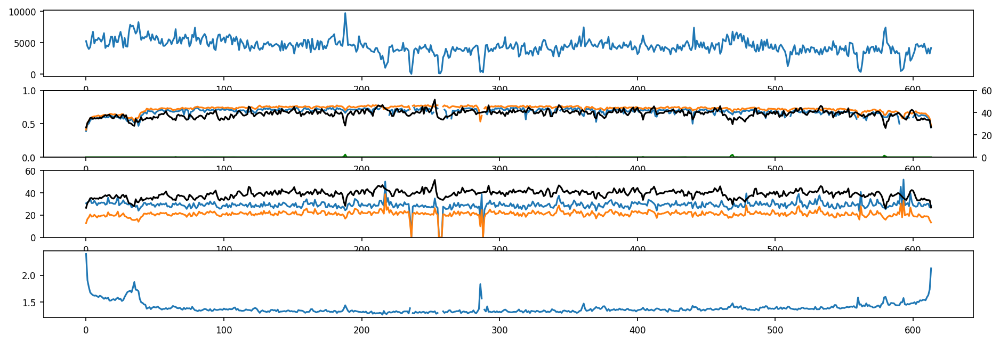

INFO:root:Iteration: 0, Mean: 1.16e+03, Stddev: 2.67e+02
INFO:root:Capping 0 non-diagonal contact probabilities to 10.0.


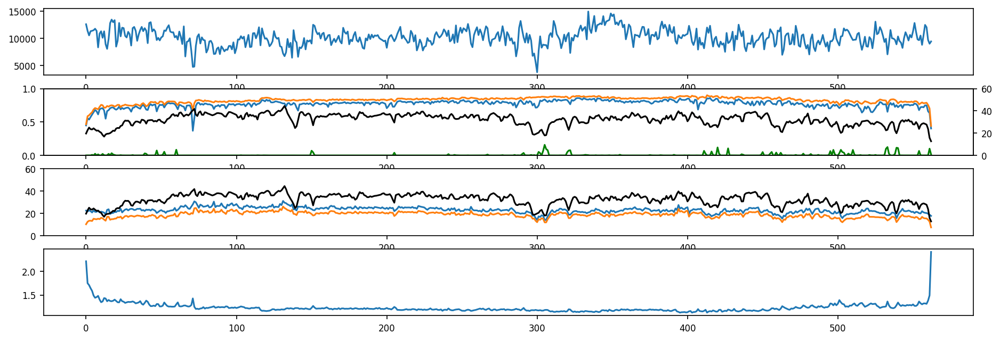

In [55]:
from neighbor_balance.neighbor import normalize_contact_map_neighbor
from neighbor_balance.plotting import get_epigenetics

for name in regions.keys():
    rcmc_contact_map = ContactMap.from_npz(f'/home/joepaggi/maxentnuc-private/figures/region_contact_maps/WT_merged/{name}.npz')

    clr = cooler.Cooler('/home/joepaggi/share/microc/jusuf_2025/wt/wt_minus_inward.mcool::/resolutions/1600')
    mat = clr.matrix(balance=True).fetch(f'{rcmc_contact_map.chrom}:{rcmc_contact_map.start}-{rcmc_contact_map.end}', rcmc_contact_map.chrom)
    region_mat = clr.matrix(balance=True).fetch(f'{rcmc_contact_map.chrom}:{rcmc_contact_map.start}-{rcmc_contact_map.end}')
    cov = np.sum(clr.matrix(balance=False).fetch(f'{rcmc_contact_map.chrom}:{rcmc_contact_map.start}-{rcmc_contact_map.end}', rcmc_contact_map.chrom), axis=1)

    rcmc_contact_map.contact_map = normalize_contact_map_neighbor(rcmc_contact_map.contact_map)
    marginal = np.nansum(rcmc_contact_map.contact_map, axis=1)
    marginal = np.array([marginal[i:i+8].mean() for i in range(0, len(marginal), 8)])
    f, axs = plt.subplots(4, figsize=(15, 5))
    axs[0].plot(cov)

    ax = axs[1]
    ax.set_ylim(0.0, 1)
    # ax.plot(np.nansum(mat, axis=1))
    cd = np.nansum(region_mat, axis=1)
    cd[cov < 3_000] = np.nan
    ax.plot(cd)
    ax.plot(np.nansum(region_mat, axis=1) / np.nansum(mat, axis=1))


    tax = ax.twinx()
    tax.plot(marginal, c='black')
    tax.set_ylim(0, 60)

    #atac =  f'/home/joepaggi/orcd/pool/omics/genomics_data/GSE98390_E14_ATAC_MERGED.DANPOS.mm39.bw'
    atac =  f'/home/joepaggi/orcd/pool/omics/new_genomics_data/ENCFF523UIR.mm39.bw'
    x, atac = get_epigenetics(atac, rcmc_contact_map.chrom, rcmc_contact_map.start, rcmc_contact_map.end, bin=True)
    atac = np.array([atac[i:i+8].mean() for i in range(0, len(atac), 8)])
    tax.plot(atac*0.1, c='green')
    #tax.plot(cov, c='magenta')

    ax = axs[2]

    mat = clr.matrix(balance='weight_neighbor').fetch(f'{rcmc_contact_map.chrom}:{rcmc_contact_map.start}-{rcmc_contact_map.end}', rcmc_contact_map.chrom)
    region_mat = clr.matrix(balance='weight_neighbor').fetch(f'{rcmc_contact_map.chrom}:{rcmc_contact_map.start}-{rcmc_contact_map.end}')

    ax.plot(np.nansum(mat, axis=1))
    ax.plot(np.nansum(region_mat, axis=1))
    
    tax = ax
    tax.plot(marginal, c='black')
    tax.set_ylim(0, 60)

    ax = axs[3]
    ax.plot(np.nansum(mat, axis=1) / np.nansum(region_mat, axis=1))

    plt.show()

In [2]:
class WholeChromosomeAnalyzer:
    def __init__(self, chrom, clr_fname, size, blacklist=f'{supercloud}/ucsc/mm39-excluderanges.bed', fa=f'{supercloud}/ucsc/mm39.fa'):
        self.chrom = chrom
        self.clr_fname = clr_fname
        self.size = size
        self.blacklist = blacklist
        self.fa = fa
        self.start, self.end = 0, self.clr.chromsizes[chrom]

        # Pre-compute some expensive tracks.
        self.mask = self._compute_blacklist_mask()
        self.compartment_scores = self._compute_compartment_scores()
        self.cis_ice_coverage, self.total_ice_coverage = self._compute_coverage(weight_name='weight')
        self.cis_neighbor_coverage, self.total_neighbor_coverage = self._compute_coverage(weight_name='weight_neighbor')
        self.cis_raw_coverage, self.total_raw_coverage = self._compute_coverage(weight_name='raw')

    @property
    def clr(self):
        return cooler.Cooler(f'{self.clr_fname}::/resolutions/{self.size}')

    def x(self, size=None):
        if size is None:
            size = self.size
        return np.arange(self.start, self.end, size) + size / 2

    def _compute_coverage(self, weight_name='weight'):
        assert weight_name in ['weight', 'weight_neighbor', 'raw']
        cis_key = f'cov_cis_{weight_name}'
        tot_key = f'cov_tot_{weight_name}'
        
        if cis_key not in self.clr.bins() or tot_key not in self.clr.bins():
            print(f'Computing coverage with weight {weight_name}')
            cooltools.coverage(self.clr, nproc=4, clr_weight_name=None if weight_name == 'raw' else weight_name, ignore_diags=0, store=True)

        cis = self.clr.bins()[cis_key]
        tot = self.clr.bins()[tot_key]
        extent = self.clr.extent(self.chrom)
        return np.array(cis[extent[0]:extent[1]]), np.array(tot[extent[0]:extent[1]])

    def _compute_compartment_scores(self):
        bins = self.clr.bins()[:]
        bins = bins.loc[bins.chrom == self.chrom]
        genome = bioframe.load_fasta(self.fa);
        gc_cov = bioframe.frac_gc(bins[['chrom', 'start', 'end']], genome)
        cis_eigs = cooltools.eigs_cis(self.clr, phasing_track=gc_cov, view_df=pd.DataFrame({'chrom': [chrom], 'start': [0], 'end': [self.clr.chromsizes[chrom]], 'name': [chrom]}), n_eigs=1)
        return cis_eigs[1]['E1']
    
    def _compute_blacklist_mask(self):
        blacklist = pd.read_csv(self.blacklist, sep='\t', header=None)
        regions = blacklist[blacklist[0] == self.chrom]
        mask = np.zeros(int(np.ceil((self.end - self.start) / self.size)), dtype=bool)
        for s, e in regions[[1, 2]].values:
            mask[(s-self.start)//self.size:(e-self.start)//self.size] = True
        return mask

    def get_local_density(self, neighbor=True):
        cmap = self.get_contact_map(neighbor=neighbor)
        return cmap.get_marginal(k=0)

    def get_contact_map(self, neighbor=False):
        contact_map = self.clr.matrix(balance='weight_neighbor' if neighbor else 'weight').fetch(self.chrom)
        #contact_map = normalize_contact_map_average(contact_map, neighbor_prob=1, max_prob=100)
        return ContactMap(contact_map, self.chrom, self.start, self.end, self.size)
    
    def get_cis_close(self, thresh=1_000_000):
        thresh_index = thresh // self.size
        cmap = self.get_contact_map()
        local_cmap = np.triu(cmap, -thresh_index)
        local_cmap = np.tril(local_cmap, thresh_index)
        full_marginal = np.nanmean(cmap, axis=1)
        region_marginal = np.nanmean(local_cmap, axis=1)
        return (region_marginal / full_marginal) * self.cis_coverage

    def get_track(self, fname):
        return bin_track(load_bw(fname, self.chrom, self.start, self.end), self.size)

    def plot(self, track_vals, cmap_ax, colorbar_ax, track_axs):
        # Plot the contact map.
        cmap = self.get_contact_map()
        neighbor_cmap = self.get_contact_map(neighbor=True)
        cmap.contact_map = normalize_contact_map_average(cmap.contact_map, neighbor_prob=1, max_prob=100)
        neighbor_cmap.contact_map = normalize_contact_map_average(neighbor_cmap.contact_map, neighbor_prob=1, max_prob=100)
        compare_cmap = cmap.copy()
        compare_cmap.contact_map = np.triu(cmap.contact_map) + np.tril(neighbor_cmap.contact_map, k=1)
        im = compare_cmap.plot_contact_map(ax=cmap_ax, colorbar=False)
        plt.colorbar(im, cax=colorbar_ax)

        # # Plot the neighbors.
        i = 0
        density = self.get_local_density()
        density /= np.nanmedian(density)
        track_axs[i].set_ylabel('Norm. total contacts', rotation=0, ha='right', va='center')
        track_axs[i].plot(self.x(), density, label='neighbors', c='magenta')

        density = self.get_local_density(neighbor=False)
        density /= np.nanmedian(density)
        track_axs[i].plot(self.x(), density, label='neighbors', c='gray')
        track_axs[i].set_ylim(0.5, 2)
        i += 1

        # Plot the A/B compartment score.
        track_axs[i].set_ylabel('A/B', rotation=0, ha='right', va='center')
        track_axs[i].fill_between(self.x(size=25_600), 0, np.maximum(0, self.compartment_scores), color='green', edgecolor='none')
        track_axs[i].fill_between(self.x(size=25_600), 0, np.minimum(0, self.compartment_scores), color='red', edgecolor='none')
        i += 1

        # Plot epigenetics tracks.
        for track_name, track in track_vals.items():
            i += 1
            if np.all(np.isnan(track)):
                continue
            track_axs[i].plot(self.x(), track, label=track_name)
            track_axs[i].set_ylabel(track_name, rotation=0, ha='right', va='center')
            track_axs[i].set_ylim(np.percentile(track, 0.1), np.percentile(track, 99.9))

        # Format the axes.
        for ax in [cmap_ax] + track_axs[:-1]:
            plt.setp(ax.get_xticklabels(), visible=False)

    def plot_fraction_contacts(self, buf=0.2, samples=200):
        a_mask = self.compartment_scores > buf
        b_mask = self.compartment_scores < -buf
        contact_map = self.get_contact_map().contact_map

        a, b = [], []
        x = np.linspace(size, contact_map.shape[0]*size, samples)
        for thresh in x:
            local_contact_map = np.triu(contact_map, -(thresh // self.size))
            local_contact_map = np.tril(local_contact_map, (thresh // self.size))
            region_marginal = np.nansum(local_contact_map, axis=1)
            a += [np.nanmean((region_marginal/self.total_ice_coverage)[a_mask])]
            b += [np.nanmean((region_marginal/self.total_ice_coverage)[b_mask])]

        f, ax = plt.subplots(1, 2, figsize=(6, 2.5))

        masked_contact_map = self.get_contact_map()
        masked_contact_map.contact_map[~a_mask] = np.nan
        masked_contact_map.plot_distance_average(label='A', ax=ax[0], color='green')

        masked_contact_map = self.get_contact_map()
        masked_contact_map.contact_map[~b_mask] = np.nan
        masked_contact_map.plot_distance_average(label='B', ax=ax[0], color='red')
        ax[0].set_title('Average contact frequency')

        ax[1].plot(x, a, label='A', c='green')
        c = np.nanmean((self.cis_ice_coverage/self.total_ice_coverage)[a_mask])
        ax[1].axhline(c, c='green', linestyle='--')

        ax[1].plot(x, b, label='B', c='red')
        c = np.nanmean((self.cis_ice_coverage/self.total_ice_coverage)[b_mask])
        ax[1].axhline(c, c='red', linestyle='--')

        ax[1].set_xscale('log')
        format_ticks(ax[1], y=False)
        ax[1].legend()
        ax[1].set_ylim(0, 1)
        ax[1].set_title('Fraction of contacts within separation')
        return f, ax

    def plot_total_contacts(self, neighbor=False, buf=0.2, samples=200):
        a_mask = self.compartment_scores > buf
        b_mask = self.compartment_scores < -buf
        contact_map = self.get_contact_map(neighbor=neighbor).contact_map

        # Get the total contacts for the compartments.
        x = np.linspace(self.size, contact_map.shape[0]*self.size, samples)
        a, b = [], []
        for thresh in x:
            local_contact_map = np.triu(contact_map, -(thresh // self.size))
            local_contact_map = np.tril(local_contact_map, (thresh // self.size))
            region_marginal = np.nansum(local_contact_map, axis=1)
            a += [np.nanmean(region_marginal[a_mask])]
            b += [np.nanmean(region_marginal[b_mask])]

        f, ax = plt.subplots(1, 2, figsize=(6, 2.5))

        # Plot P(s) for a and b compartments.
        ax[0].set_title('Average contact frequency')
        masked_contact_map = self.get_contact_map(neighbor=neighbor)
        masked_contact_map.contact_map[~a_mask] = np.nan
        masked_contact_map.plot_distance_average(label='A', ax=ax[0], color='green')
        masked_contact_map = self.get_contact_map(neighbor=neighbor)
        masked_contact_map.contact_map[~b_mask] = np.nan
        masked_contact_map.plot_distance_average(label='B', ax=ax[0], color='red')

        # Plot total contacts.
        ax[1].set_title('Total contacts within separation')
        ax[1].plot(x, a, label='A', c='green')
        ax[1].plot(x, b, label='B', c='red')

        if neighbor:
            tot, cis = self.total_neighbor_coverage, self.cis_neighbor_coverage
        else:
            tot, cis = self.total_ice_coverage, self.cis_ice_coverage
        ax[1].axhline(tot[a_mask].mean(), c='green', ls='--')
        ax[1].axhline(tot[b_mask].mean(), c='red', ls='--')

        # This was just a sanity check.
        # ax[1].axhline(cis[a_mask].mean(), c='green', ls=':', label='A cis mean')
        # ax[1].axhline(cis[b_mask].mean(), c='red', ls=':', label='B cis mean')

        # Clean up axes.
        ax[1].set_xscale('log')
        format_ticks(ax[1], y=False)
        ax[1].legend()
        return f, ax


analyzers = {}
for region_name, region in regions.items():
    print(region_name)
    chrom, region_start, region_end = parse_region(regions[region_name])
    analyzers[region_name] = WholeChromosomeAnalyzer(chrom, genome_wide_cool, size,
                                                     blacklist='/home/joepaggi/share/ucsc/mm39-excluderanges.bed',
                                                     fa='/home/joepaggi/share/ucsc/mm39.fa')

ppm1g


/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/bioframe/extras.py:316: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg = df.groupby("chrom", sort=False)[["start", "end"]].apply(_each)
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/cooltools/lib/checks.py:550: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for name, group in track.groupby(track.columns[0]):
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/cooltools/lib/common.py:489: UserWarning: less than 50% of valid bins have been assigned a value
  warnings.warn("less than 50% of valid bins h

nanog


/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/bioframe/extras.py:316: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg = df.groupby("chrom", sort=False)[["start", "end"]].apply(_each)
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/cooltools/lib/checks.py:550: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for name, group in track.groupby(track.columns[0]):
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/cooltools/lib/common.py:489: UserWarning: less than 50% of valid bins have been assigned a value
  warnings.warn("less than 50% of valid bins h

sox2


/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/bioframe/extras.py:316: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg = df.groupby("chrom", sort=False)[["start", "end"]].apply(_each)
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/cooltools/lib/checks.py:550: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for name, group in track.groupby(track.columns[0]):
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/cooltools/lib/common.py:489: UserWarning: less than 50% of valid bins have been assigned a value
  warnings.warn("less than 50% of valid bins h

fbn2


/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/bioframe/extras.py:316: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg = df.groupby("chrom", sort=False)[["start", "end"]].apply(_each)
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/cooltools/lib/checks.py:550: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for name, group in track.groupby(track.columns[0]):
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/cooltools/lib/common.py:489: UserWarning: less than 50% of valid bins have been assigned a value
  warnings.warn("less than 50% of valid bins h

klf1


/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/bioframe/extras.py:316: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg = df.groupby("chrom", sort=False)[["start", "end"]].apply(_each)
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/cooltools/lib/checks.py:550: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for name, group in track.groupby(track.columns[0]):
/home/joepaggi/miniconda3/envs/neighbor/lib/python3.12/site-packages/cooltools/lib/common.py:489: UserWarning: less than 50% of valid bins have been assigned a value
  warnings.warn("less than 50% of valid bins h

ppm1g


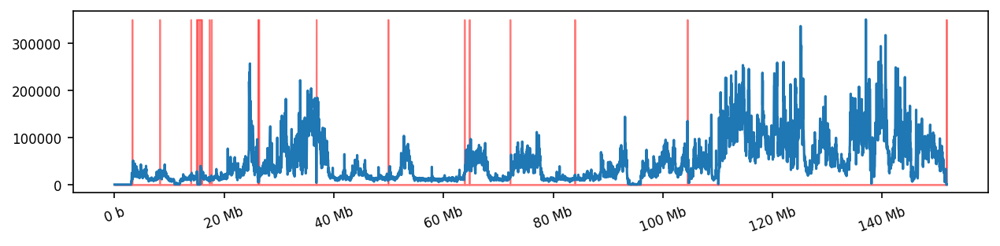

nanog


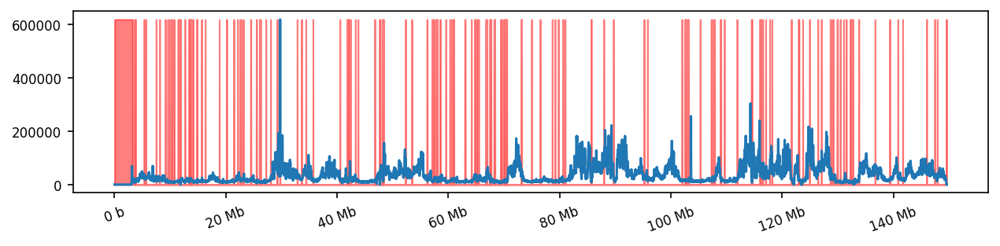

sox2


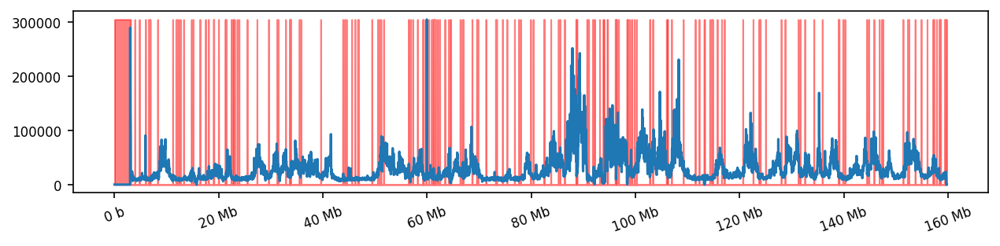

fbn2


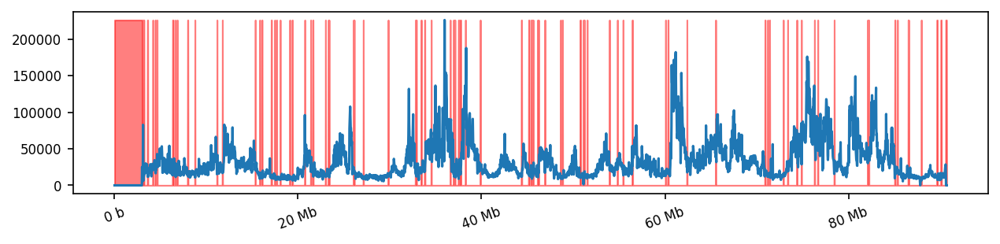

klf1


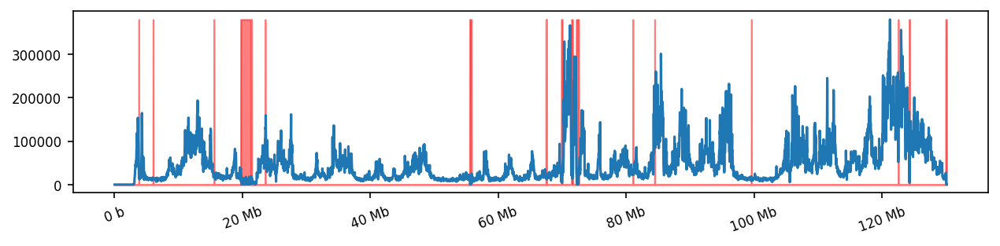

In [3]:
for region_name, analyzer in analyzers.items():
    print(region_name)
    chrom, region_start, region_end = parse_region(regions[region_name])

    # Plot the exclude regions.
    f, ax = plt.subplots(figsize=(10, 2))
    plt.plot(analyzer.x(), analyzer.total_raw_coverage)
    plt.fill_between(analyzer.x(), 0, np.nanmax(analyzer.total_raw_coverage)*analyzer.mask, color='red', alpha=0.5)
    format_ticks(ax, y=False)                   
    plt.show()

ppm1g


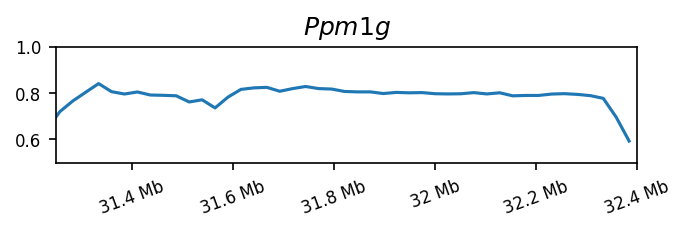

nanog


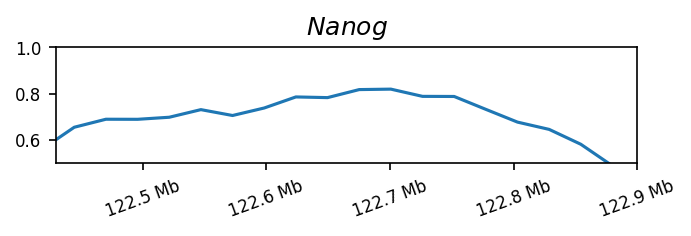

sox2


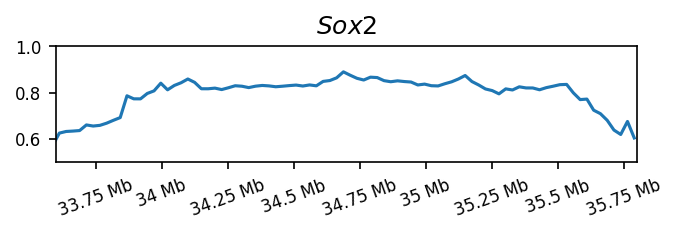

fbn2


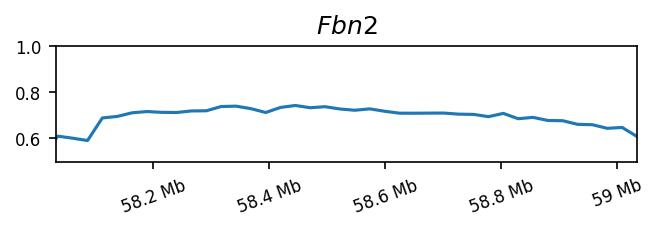

klf1


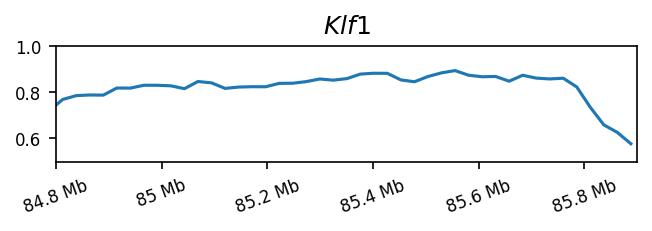

In [4]:
for region_name, analyzer in analyzers.items():
    print(region_name)
    chrom, region_start, region_end = parse_region(regions[region_name])
    
    f, ax = plt.subplots(figsize=(5, 1))
    
    cmap = analyzer.get_contact_map().contact_map
    region_start_index = region_start // analyzer.size
    region_end_index = region_end // analyzer.size + 1
    full_marginal = np.nansum(cmap[region_start_index:region_end_index], axis=1)
    region_marginal = np.nansum(cmap[region_start_index:region_end_index, region_start_index:region_end_index], axis=1)
    ax.plot(range(region_start_index*size, region_end_index*size, size), region_marginal/full_marginal)

    ax.set_title(stylize_gene_name(region_name))
    format_ticks(ax, y=False)
    plt.ylim(0.5, 1.0)
    plt.xlim(region_start, region_end)
    plt.savefig(f'img/gw_inregion_{region_name}.pdf')
    plt.show()

ppm1g


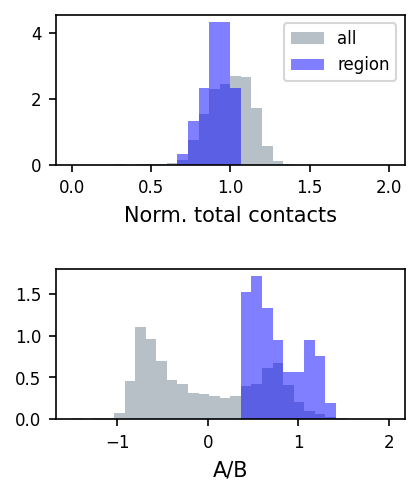

nanog


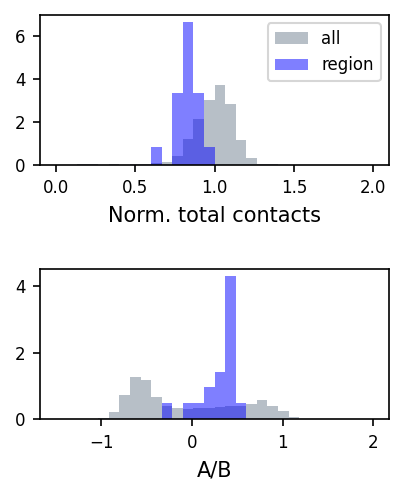

sox2


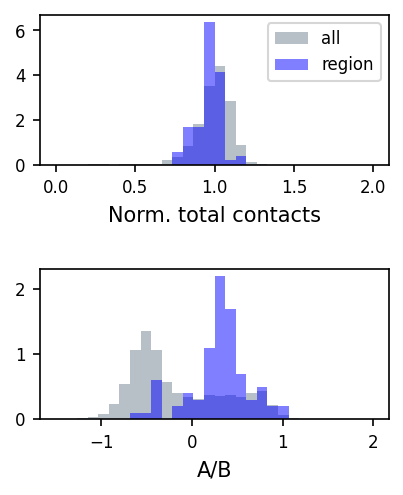

fbn2


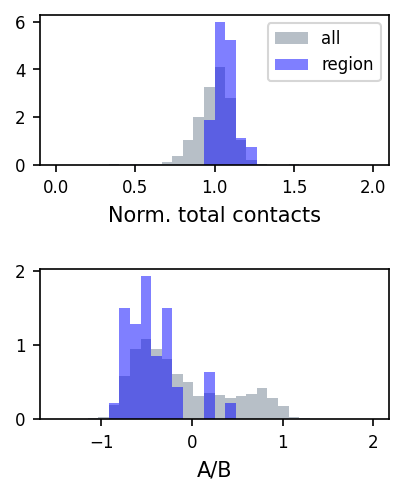

klf1


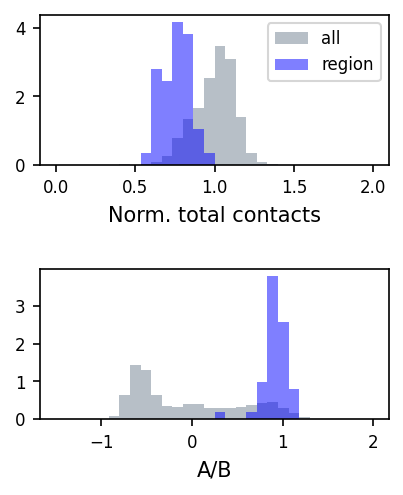

In [5]:
for region_name, analyzer in analyzers.items():
    print(region_name)
    chrom, region_start, region_end = parse_region(regions[region_name])
    region_start_index = region_start // analyzer.size  # TODO: this fails if the cmap doesn't start at zero.
    region_end_index = region_end // analyzer.size

    bins = np.linspace(0, 2, 31)
    f, ax = plt.subplots(2, figsize=(3, 3.5), gridspec_kw={'hspace': 0.7})
    density = analyzer.get_local_density()
    density[analyzer.mask] = np.nan
    density[analyzer.total_raw_coverage < 10_000] = np.nan
    density /= np.nanmean(density)
    ax[0].hist(density, bins=bins, alpha=0.5, color='slategray', label='all', density=True)
    ax[0].hist(density[region_start_index:region_end_index], bins=bins, alpha=0.5, color='blue', label='region', density=True)
    ax[0].set_xlabel('Norm. total contacts')

    bins = np.linspace(-1.5, 2.0, 31)
    ax[1].set_xlabel("A/B")
    ax[1].hist(analyzer.compartment_scores, bins=bins, alpha=0.5, color='slategray', label='all', density=True)
    ax[1].hist(analyzer.compartment_scores[region_start_index:region_end_index], bins=bins, alpha=0.5, color='blue', label='region', density=True)
    ax[0].legend()
    plt.savefig(f'img/gw_ab_{region_name}.pdf')
    plt.show()

ppm1g


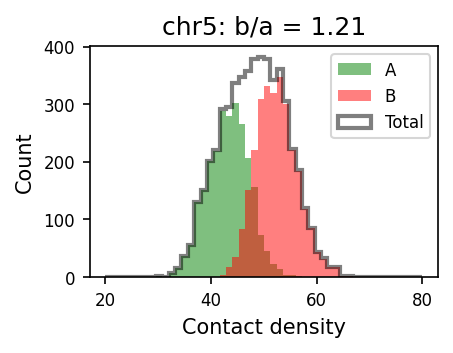

nanog


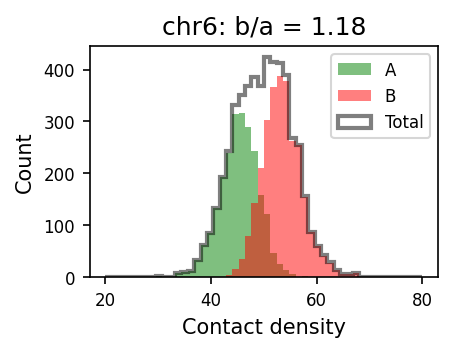

sox2


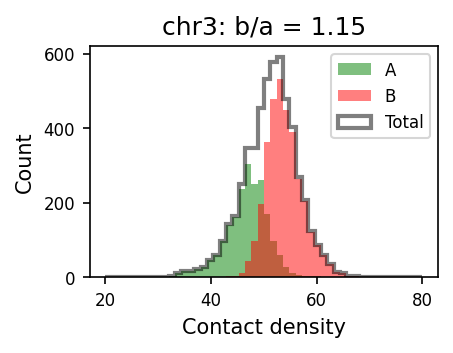

fbn2


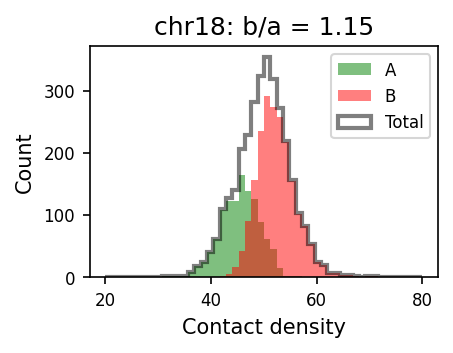

klf1


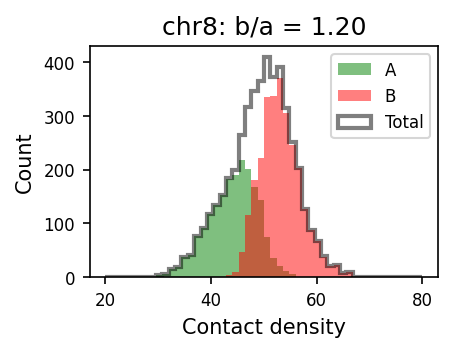

In [6]:
for region_name, analyzer in analyzers.items():
    print(region_name)
    chrom, region_start, region_end = parse_region(regions[region_name])
    region_start_index = region_start // analyzer.size  # TODO: this fails if the cmap doesn't start at zero.
    region_end_index = region_end // analyzer.size

    bins = np.linspace(20, 80, 51)
    f, ax = plt.subplots(figsize=(3, 2))
    density = analyzer.total_neighbor_coverage.copy()
    density[analyzer.mask] = np.nan
    density[analyzer.total_raw_coverage < 10_000] = np.nan
    #density /= np.nanmean(density)

    ab = analyzer.compartment_scores.copy()
    ab[analyzer.mask] = np.nan
    ab[analyzer.total_raw_coverage < 10_000] = np.nan
    
    ax.hist(density[ab > 0], bins=bins, alpha=0.5, color='green', label='A', histtype='stepfilled')
    ax.hist(density[ab < 0], bins=bins, alpha=0.5, color='red', label='B', histtype='stepfilled')
    ax.hist(density, bins=bins, alpha=0.5, color='black', label='Total', histtype='step', lw=2)
    #plt.xscale('log')
    plt.legend()
    plt.xlabel('Contact density')
    plt.ylabel('Count')
    plt.title(f'{chrom}: b/a = {np.nanmean(density[ab < 0]) / np.nanmean(density[ab > 0]):.2f}')
    plt.savefig(f'img/gw_contacts_hist_{region_name}.pdf')
    plt.show()

# Neighbor factors from genome-wide map are correlated with RCMC neighbor factors, but are far noisier.

ppm1g


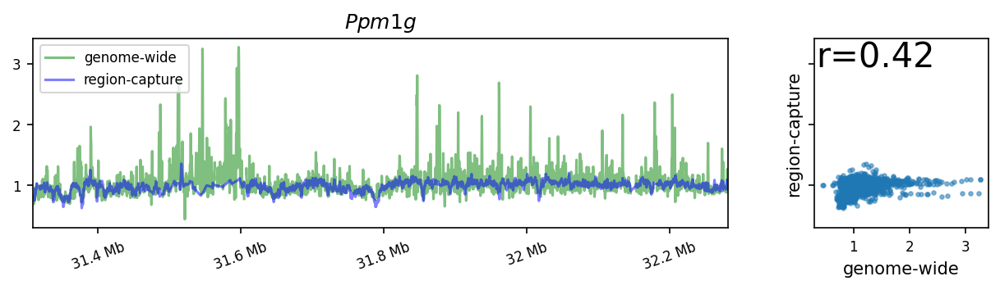

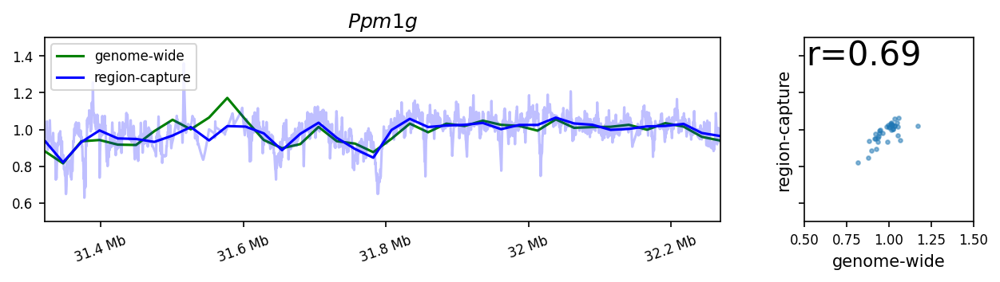

nanog


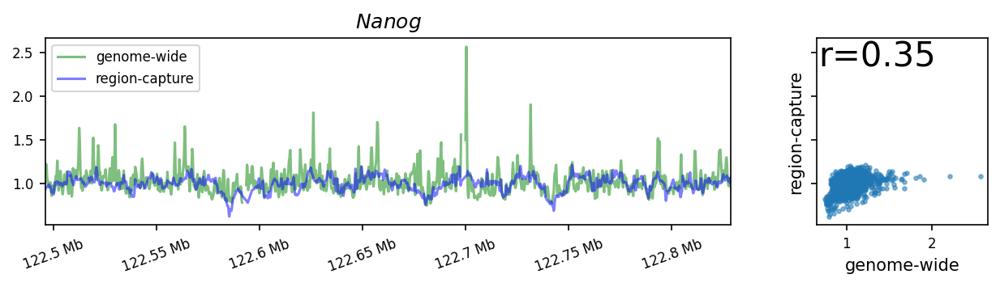

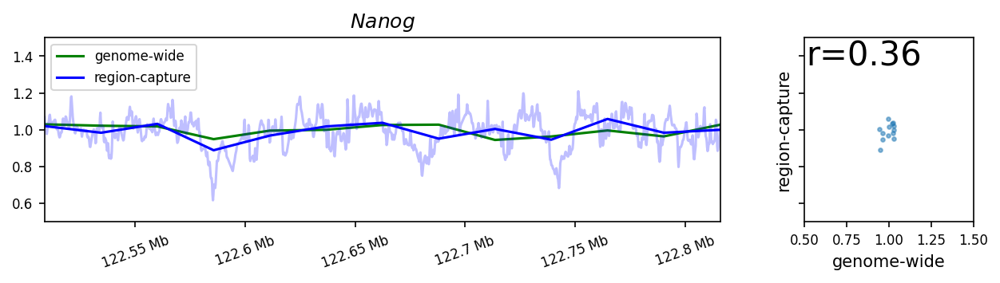

sox2


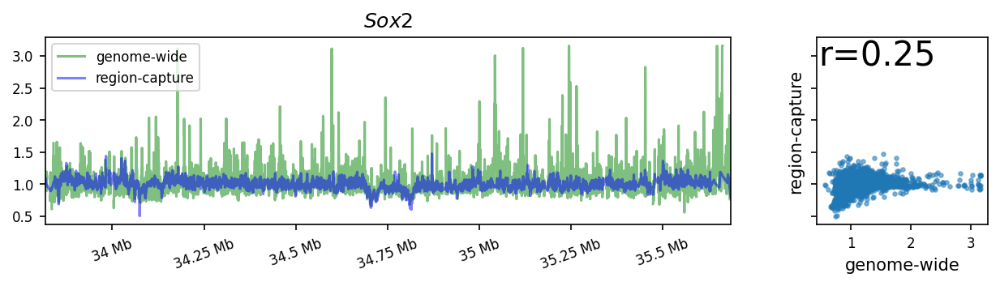

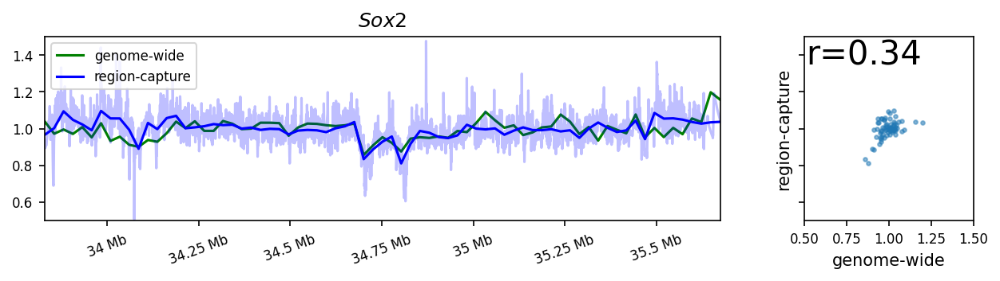

fbn2


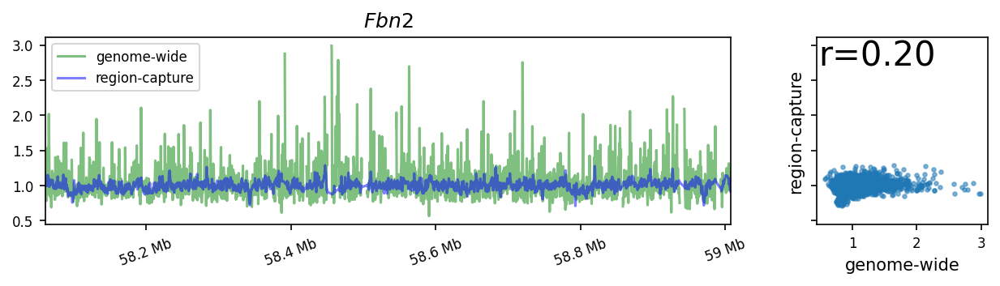

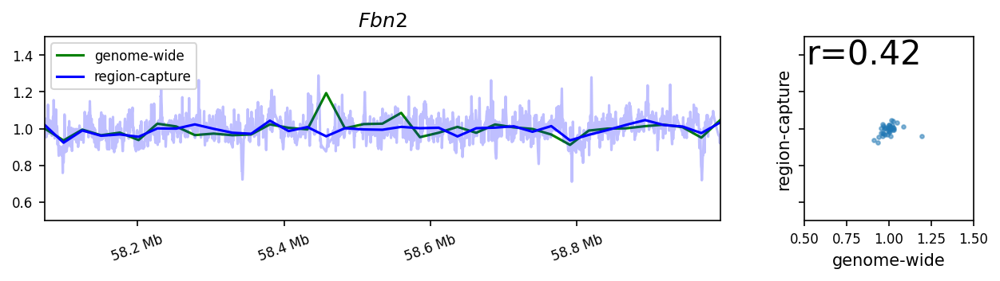

klf1


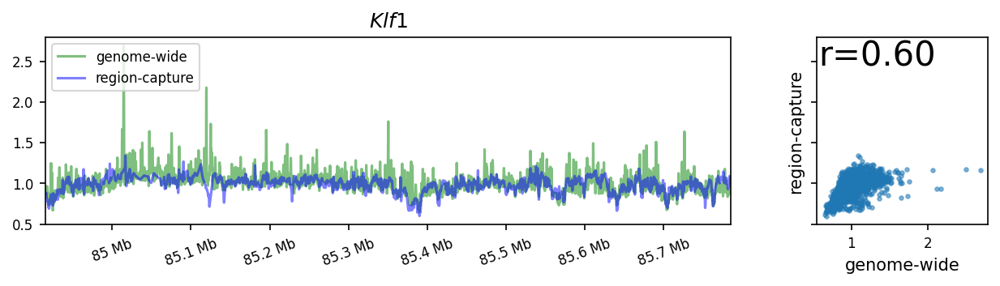

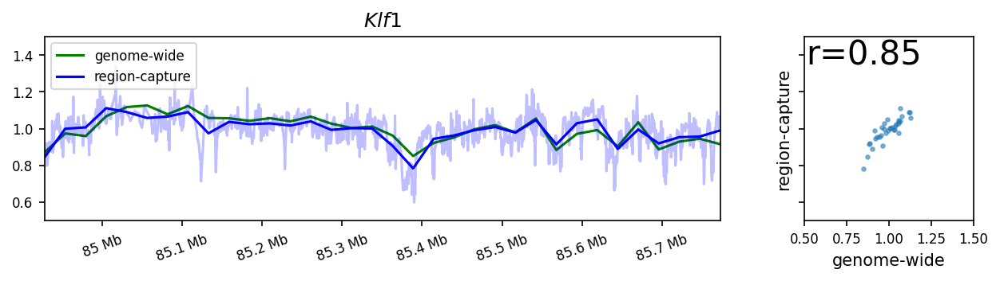

In [7]:
from neighbor_balance.neighbor import get_neighbor_factors
from scipy.ndimage import gaussian_filter1d

def correlate(x, metric1, metric2, name1, name2, color1='green', color2='blue', same_y=False, alpha=0.5):
    f, ax = plt.subplots(1, 2, figsize=(10, 2), gridspec_kw={'width_ratios': [4, 1]}, sharey=True)
    
    if same_y:
        tax = ax[0]
    else:
        tax = ax[0].twinx()

    ax[0].plot(x, metric1, c=color1, label=name1, alpha=alpha)
    tax.plot(x, metric2, c=color2, label=name2, alpha=alpha)

    format_ticks(ax[0], y=False)
    ax[0].legend(loc='upper left')
    if not same_y:
        tax.legend(loc='upper right')

    ax[0].set_xlim(x[0], x[-1])

    mask = ~(np.isnan(metric1) | np.isnan(metric2))
    ax[1].text(0.01, 0.99, f'r={spearmanr(metric1[mask], metric2[mask])[0]:.2f}', size=20, transform=ax[1].transAxes, va='top', ha='left')
    ax[1].scatter(metric1, metric2, alpha=0.5, s=5)
    ax[1].set_ylabel(name2)
    ax[1].set_xlabel(name1)
    return f, ax

def get_neighbor_factors_from_cooler(analyzer, size=200):
    clr = cooler.Cooler(f'{analyzer.clr_fname}::/resolutions/{size}')
    extent = clr.extent(analyzer.chrom)
    return clr.bins()['weight'][extent[0]:extent[1]] / clr.bins()['weight_neighbor'][extent[0]:extent[1]]

for region_name, analyzer in analyzers.items():
    print(region_name)
    # chrom, region_start, region_end = parse_region(regions[region_name])
    # cool = f'{supercloud}/rcmc/WT_BR1/select_corrected_minus_inward.mcool'
    # rcmc = cooler.Cooler(f'{cool}::/resolutions/200').matrix(balance=True).fetch(regions[region_name])
    # rcmc_neighbors = np.diagonal(rcmc, 1)
    # rcmc_neighbors = np.sqrt(np.concatenate([rcmc_neighbors, [0]]) + np.concatenate([[0], rcmc_neighbors]))
    # rcmc_neighbors = rcmc_neighbors / np.nanmedian(rcmc_neighbors)
    # 

    rcmc_contact_map = ContactMap.from_npz(f'region_contact_maps/WT_merged/{region_name}.npz')

    # offset the map to be aligned with the genome-wide contact map.
    start_offset = (size - rcmc_contact_map.start % size)
    end_offset = (rcmc_contact_map.end % size)
    assert start_offset % 200 == 0 and end_offset % 200 == 0, "Offsets must be multiples of 200."
    rcmc_contact_map.contact_map = rcmc_contact_map.contact_map[start_offset//200:-end_offset//200, start_offset//200:-end_offset//200]
    rcmc_contact_map.start = rcmc_contact_map.start + start_offset
    rcmc_contact_map.end = rcmc_contact_map.end - end_offset

    region_start = rcmc_contact_map.start
    region_end = rcmc_contact_map.end

    # Get rcmc neighbor factors
    rcmc_neighbors = np.sqrt(get_neighbor_factors(np.diagonal(rcmc_contact_map.contact_map, 1)))
    rcmc_neighbors = gaussian_filter1d(rcmc_neighbors, 1, mode='reflect')
    cg_rcmc_neighbors = np.array([np.nanmean(rcmc_neighbors[i:i+size//200]) for i in range(0, len(rcmc_neighbors), size//200)])
    
    region_start_index = region_start // 200  # TODO: this fails if the cmap doesn't start at zero.
    region_end_index = region_end // 200
    
    gw_neighbors = get_neighbor_factors_from_cooler(analyzer)[region_start // 200:region_end // 200]
    gw_neighbors = gaussian_filter1d(gw_neighbors, 1, mode='reflect')
    cg_gw_neighbors = get_neighbor_factors_from_cooler(analyzer, size=size)[region_start // size:region_end // size]

    gw_neighbors = gw_neighbors / np.nanmedian(gw_neighbors)
    rcmc_neighbors = rcmc_neighbors / np.nanmedian(rcmc_neighbors)
    cg_rcmc_neighbors = cg_rcmc_neighbors / np.nanmedian(cg_rcmc_neighbors)
    cg_gw_neighbors = cg_gw_neighbors / np.nanmedian(cg_gw_neighbors)

    x = np.arange(region_start, region_end, 200) + 200 / 2
    cg_x = np.arange(region_start, region_end, size) + size / 2
    f, ax = correlate(x, 1/gw_neighbors, 1/rcmc_neighbors, 'genome-wide', 'region-capture', same_y=True)
    ax[0].set_title(stylize_gene_name(region_name))
    plt.savefig(f'img/gw_rcmc_{region_name}.pdf')
    plt.show()

    f, ax = correlate(cg_x, 1/cg_gw_neighbors, 1/cg_rcmc_neighbors, 'genome-wide', 'region-capture', same_y=True, alpha=1)
    ax[0].plot(x, 1/rcmc_neighbors, c='blue', alpha=0.25)
    ax[0].set_title(stylize_gene_name(region_name))
    ax[0].set_ylim(0.5, 1.5)
    ax[1].set_xlim(0.5, 1.5)
    plt.savefig(f'img/gw_rcmc_cg_{region_name}.pdf')
    plt.show()

ppm1g


INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.


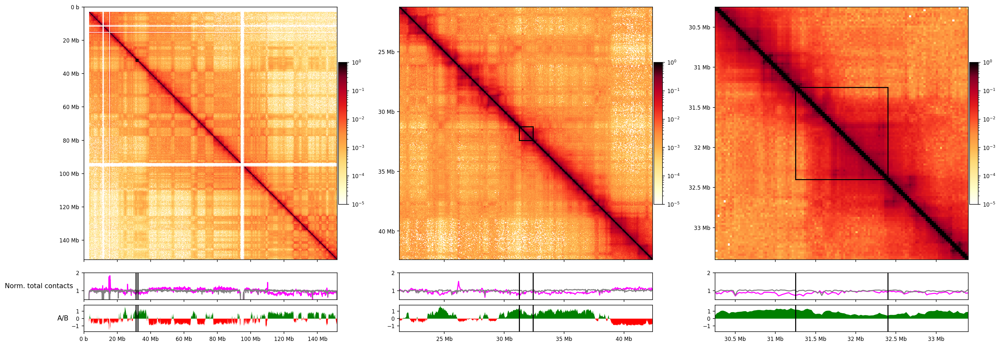

nanog


INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.


INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.


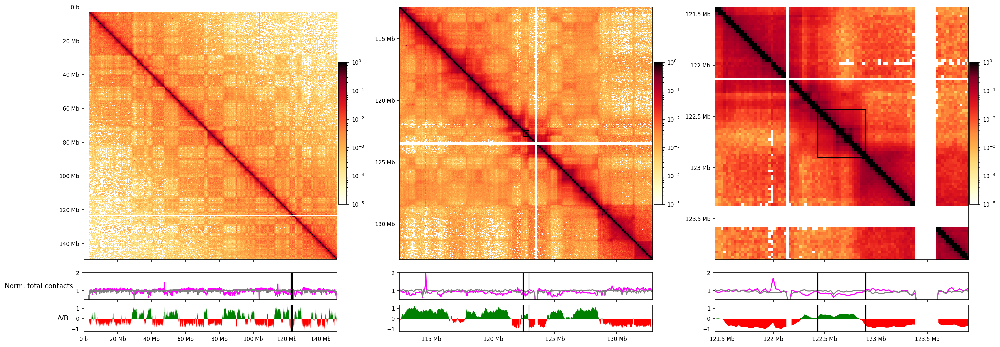

sox2


INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.


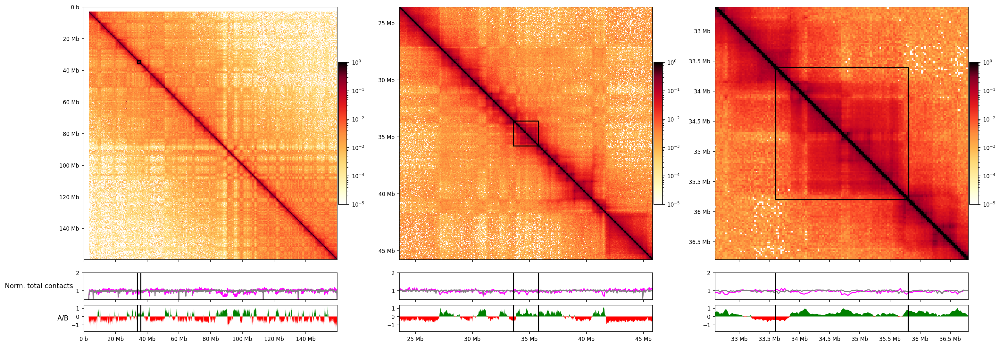

INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.


fbn2


INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.


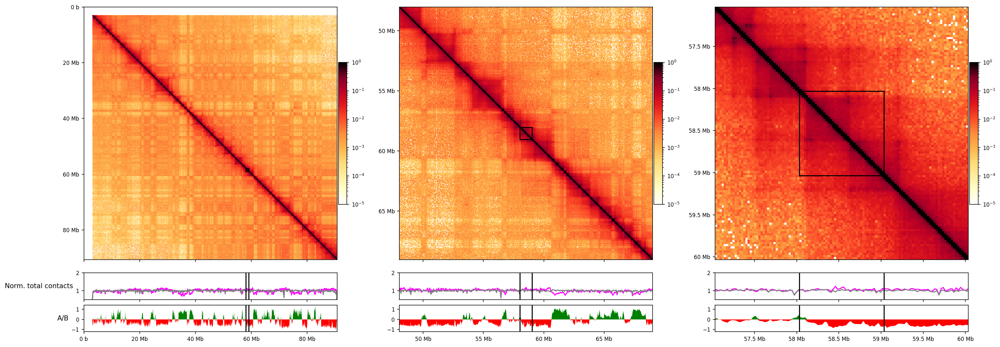

klf1


INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.
INFO:root:Capping 0 non-diagonal contact probabilities to 100.


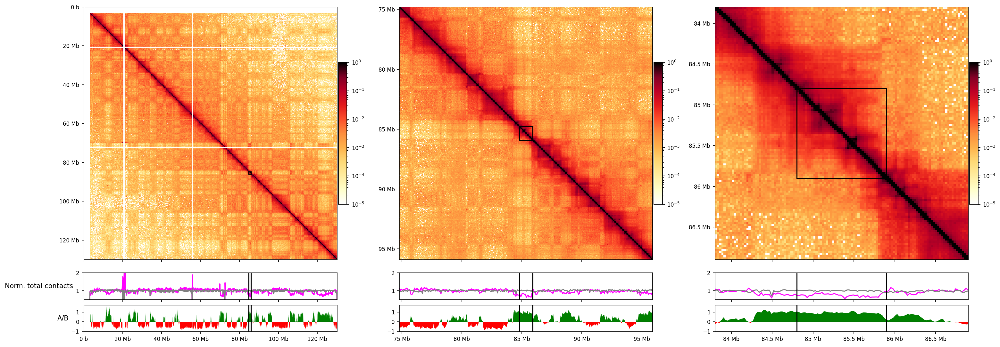

In [8]:
contexts = [None, 10_000_000, 1_000_000]
res = [102_400, 51_200, 25_600]

for region_name, analyzer in analyzers.items():
    print(region_name)
    chrom, region_start, region_end = parse_region(regions[region_name])

    # Get the epigenetics tracks.
    # track_vals = {}
    # for track_name, track_fname in tracks.items():
    #     track_vals[track_name] = analyzer.get_track(track_fname)

    # Plot the contact map and tracks.
    N_tracks = 2 #+ len(tracks)
    fig = plt.figure(figsize=(8*len(contexts), 7 + N_tracks))
    outer = gridspec.GridSpec(1, len(contexts), wspace=0.2)
    for context_index in range(len(contexts)):
        inner = outer[context_index].subgridspec(1 + N_tracks, 2,  height_ratios=[10] + [1]*N_tracks, width_ratios=[30, 1], wspace=0.01, hspace=0.05)
        cmap_ax = plt.subplot(inner[0, 0])
        colorbar_ax = plt.subplot(inner[0, 1].subgridspec(3, 1, height_ratios=[1, 3, 1])[1])
        track_axs = [plt.subplot(inner[i, 0], sharex=cmap_ax) for i in range(1, N_tracks+1)]

        analyzer.size = res[context_index]
        analyzer.plot({}, cmap_ax, colorbar_ax, track_axs)
        analyzer.size = size

        if contexts[context_index] is not None:
            cmap_ax.set_xlim(region_start-contexts[context_index], region_end+contexts[context_index])
            cmap_ax.set_ylim(region_end+contexts[context_index], region_start-contexts[context_index])
            for track_ax in track_axs:
                track_ax.set_ylabel('')
        else:
            cmap_ax.set_xlim(analyzer.start, analyzer.end)
            cmap_ax.set_ylim(analyzer.end, analyzer.start)
            

        if contexts[context_index] != 0:
            for ax in track_axs:
                ax.axvline(region_start, c='black')
                ax.axvline(region_end, c='black')

            cmap_ax.plot([region_start, region_start], [region_start, region_end], c='black')
            cmap_ax.plot([region_end, region_end], [region_start, region_end], c='black')
            cmap_ax.plot([region_start, region_end], [region_start, region_start], c='black')
            cmap_ax.plot([region_start, region_end], [region_end, region_end], c='black')

    plt.savefig(f'img/gw_{region_name}_zoom.pdf')
    plt.show()

# Correlate density, compartments, and coverage

ppm1g


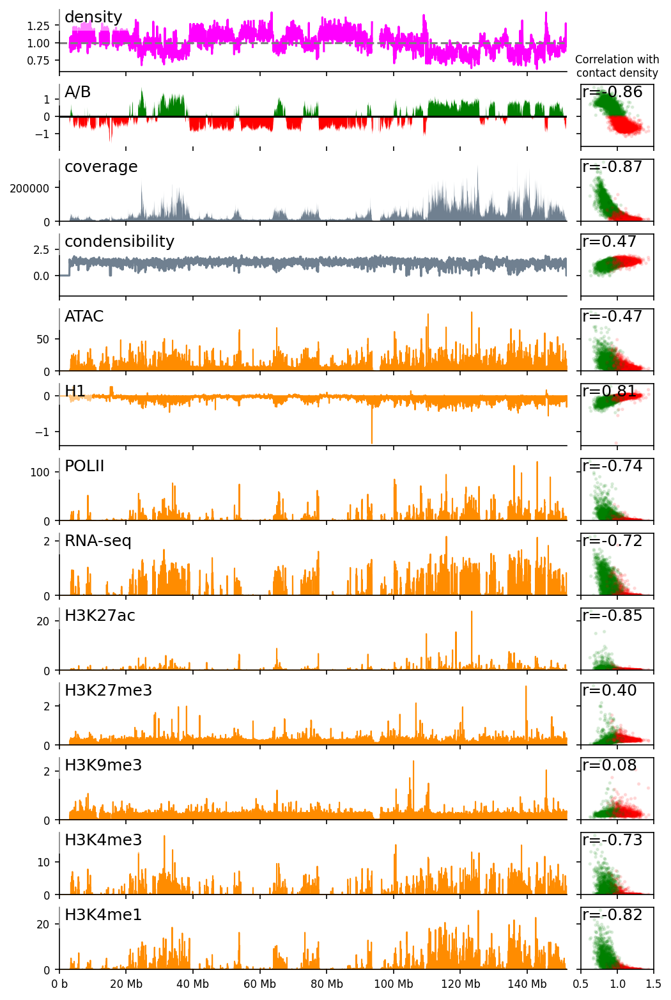

nanog


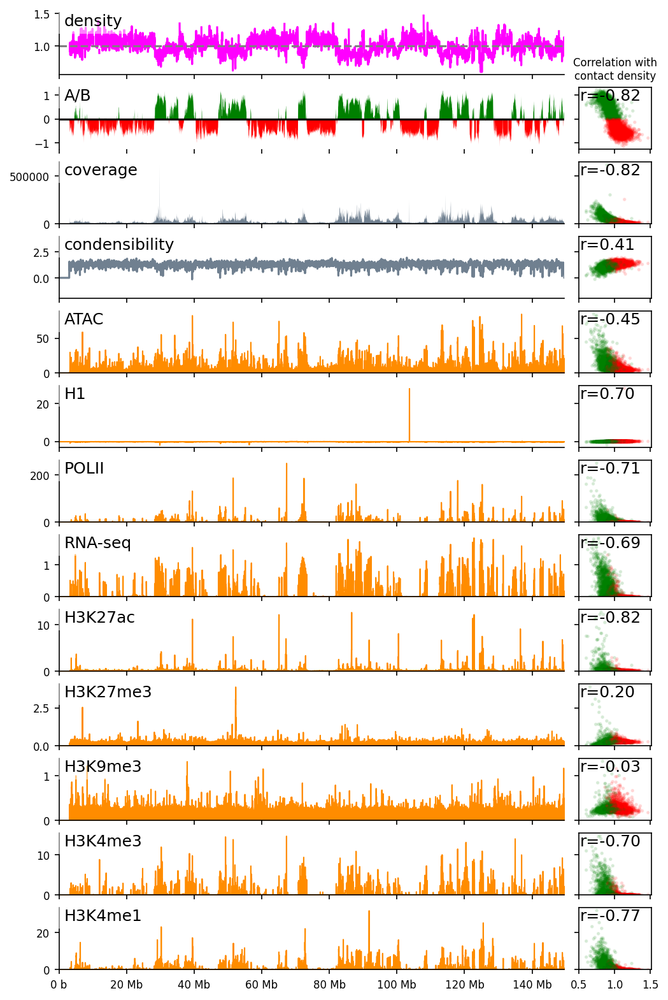

sox2


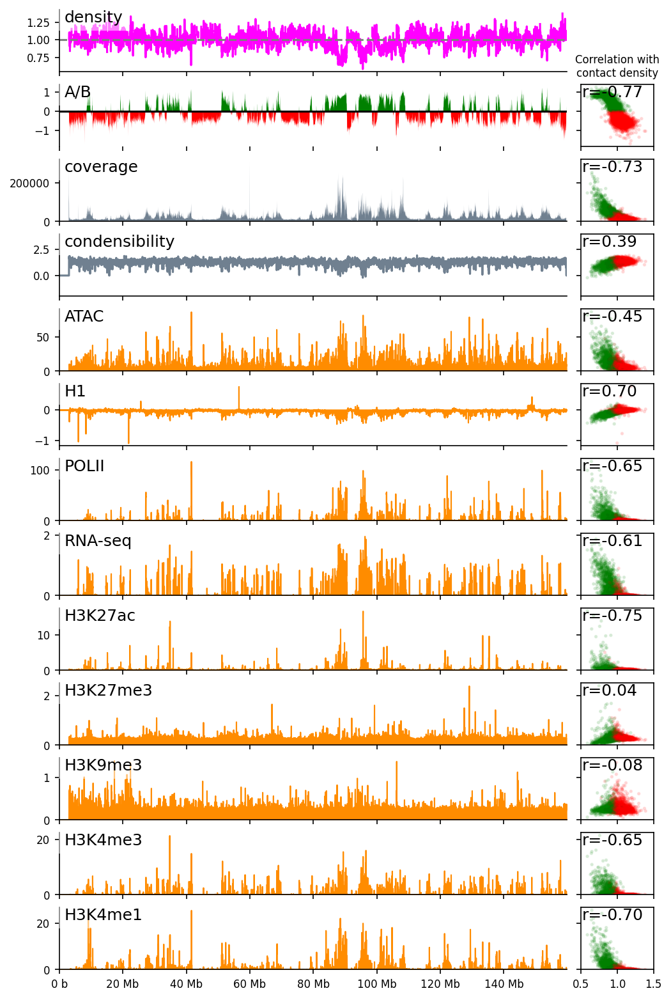

fbn2
Chromosome chr18 not found in /home/joepaggi/orcd/pool/omics/genomics_data/GSM1124783_H1d-1_IP-IN.mm39.bw


/orcd/home/002/joepaggi/neighbor-balance/neighbor_balance/plotting.py:111: RuntimeWarning: Mean of empty slice
  return np.array([np.nanmean(vals[i:i+step]) for i in range(0, len(vals), step)])


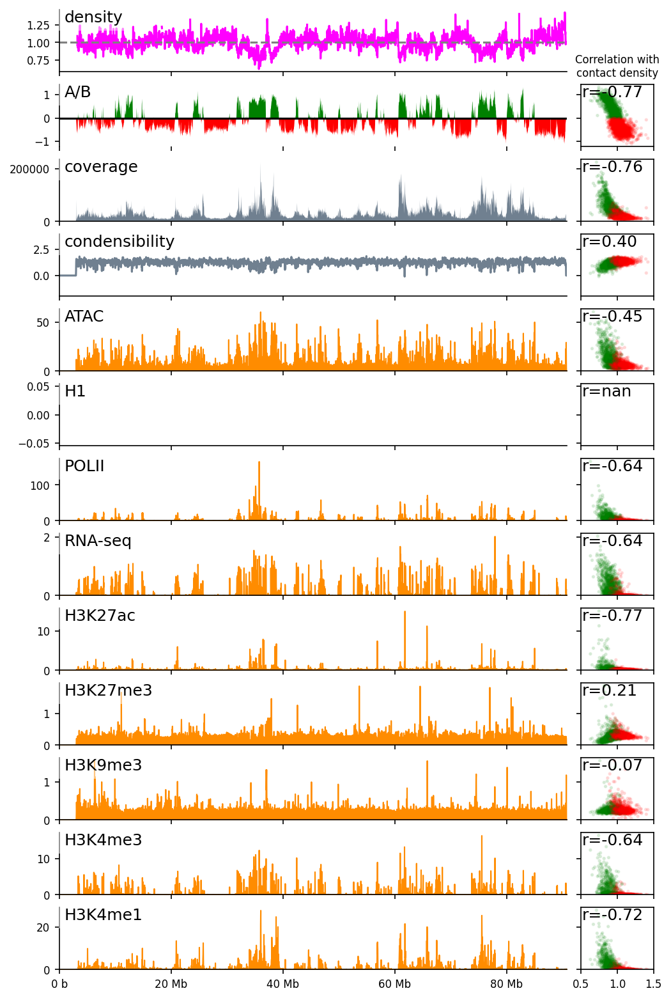

klf1


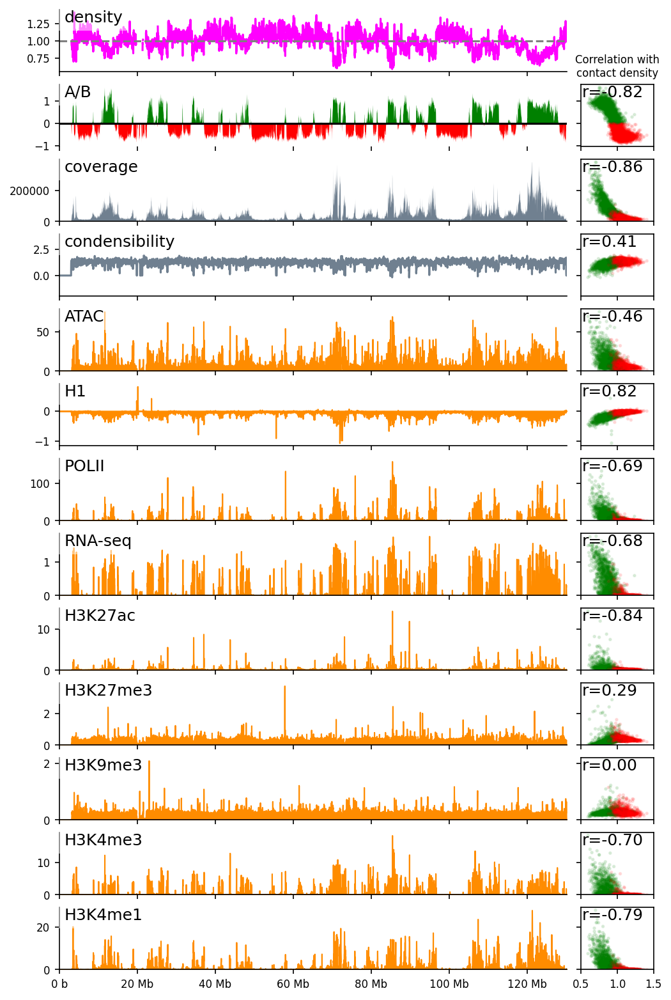

In [18]:
from matplotlib.colors import ListedColormap

def myscatter(x, y, ab, ax=None, alpha=0.1, s=3, **kwargs):
    if ax is None:
        f, ax = plt.subplots()
    cmap = ListedColormap(["green", "red"])
    mask = ~(np.isnan(x) | np.isnan(y))
    ax.text(0.01, 0.99, f'r={spearmanr(x[mask], y[mask])[0]:.2f}', size=12, transform=ax.transAxes, va='top', ha='left')
    ax.scatter(x, y, c=ab, cmap=cmap, alpha=alpha, s=s, **kwargs)
    return ax

def epigenetics_plot(x, metrics, tracks, chrom=None, start=None, end=None, smoothing=200, bin=True, ylims=None, width=20,
                     track_height=1.0, metric_height=1.0):
    height_ratios = [metric_height]*len(metrics)
    height_ratios += [track_height]*len(tracks)
    f, axs = plt.subplots(len(height_ratios), 2, figsize=(width, sum(height_ratios)), sharex='col', sharey='row',
                          gridspec_kw={'height_ratios': height_ratios, 'width_ratios': [7, 1], 'wspace': 0.05})
    
    axs[1, 1].set_title('Correlation with\ncontact density', size=8)

    def format_ylabel(ax, name):
        # ax.set_ylabel(name, rotation=0, ha='left', labelpad=-10,
        #               bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
        #ax.set_ylabel(name, rotation=0, ha='right', va='center')
        ax.text(0.01, 0.99, name, size=12, transform=ax.transAxes, va='top', ha='left',
               bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
    
        #ax.yaxis.tick_right()
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        #ax.spines['left'].set_visible(False)
        if ylims is not None:
            ax.set_ylim(*ylims[name])

    
    for i, (name, metric) in enumerate(metrics.items()):
        ax = axs[i, 0]
        
        if name == 'A/B':
            ax.fill_between(x, 0, np.maximum(0, metric), color='green', edgecolor='none')
            ax.fill_between(x, 0, np.minimum(0, metric), color='red', edgecolor='none')
            ax.axhline(0, c='k')
            ax.spines['bottom'].set_visible(False)
        elif name == 'density':
            ax.plot(x, metric, c='magenta')
            ax.axhline(1, c='gray', ls='--')
        elif name == 'coverage':
            ax.fill_between(x, 0, metric, color='slategray', edgecolor='none')
            ax.set_ylim(0)
        elif name == 'condensibility':
            ax.plot(x, metric, c='slategray')
            ax.set_ylim(-2, 4)
        else:
            assert False
            
        if name == 'density':
            axs[i, 1].axis('off')
        else:
            myscatter(metrics['density'], metric, metrics['A/B'] < 0, ax=axs[i, 1])

        format_ylabel(ax, name)
            

    for i, (name, vals) in enumerate(tracks.items()):
        ax = axs[i+len(metrics), 0]
        ax.fill_between(x, np.zeros(vals.shape), vals, color='darkorange')
        format_ylabel(ax, name)

        if name != 'H1':
            ax.set_ylim(0)
        ax.set_xlim((start, end))
        
        myscatter(metrics['density'], vals, metrics['A/B'] < 0, ax=axs[i+len(metrics), 1])
        
    axs[0, 0].set_xlim((start, end))
    format_ticks(axs[0, 0], y=False)
    axs[-1, 1].set_xticks([0.5, 1.0, 1.5])
    return f, axs

condensability_rep1 = '/home/joepaggi/orcd/pool/condensibility/GSE252941_E14_NCP_sp_1rep_10kb_score_E14_NCPre3_sp_8_1rep.mm39.bw'
condensability_rep2 = '/home/joepaggi/orcd/pool/condensibility/GSE252941_E14_NCP_sp_2rep_10kb_score_E14_NCPre4_sp_8_1rep.mm39.bw'

supercloud = '/home/joepaggi/orcd/pool'
tracks = {
    'ATAC': f'{supercloud}/omics/genomics_data/GSE98390_E14_ATAC_MERGED.DANPOS.mm39.bw',

    'H1': f'{supercloud}/omics/genomics_data/GSM1124783_H1d-1_IP-IN.mm39.bw',
    # 'CTCF': f'{supercloud}/genomics_data/GSM2418860_WT_CTCF.mm39.bw',
    # 'SMC1A': f'{supercloud}/genomics_data/GSM3508477_C59_Smc1a_SpikeInNormalized.mm39.bw',
    # 'MED1': f'{supercloud}/genomics_data/GSM560347_10022009_42TM0AAXX_B6.mm39.bw',
    # 'RING1B': f'{supercloud}/genomics_data/GSE96107_ES_Ring1B.mm39.bw',
    'POLII': f'{supercloud}/omics/genomics_data/GSM6809981_WT_PolII_xChIP_r2_mm39_MERGED_rmdup_downsampled.bw',
    'RNA-seq': f'{supercloud}/omics/genomics_data/GSE123636_C59_1_2_RNAseq_coverage.mm39.bw',
    
    # These are all ENCODE signal-p data.
    'H3K27ac': f'{supercloud}/omics/new_genomics_data/ENCFF230RNU.mm39.bw',
    'H3K27me3': f'{supercloud}/omics/new_genomics_data/ENCFF160FEV.mm39.bw',
    'H3K9me3': f'{supercloud}/omics/new_genomics_data/ENCFF293DGT.mm39.bw',
    'H3K4me3': f'{supercloud}/omics/new_genomics_data/ENCFF523UIR.mm39.bw',
    'H3K4me1': f'{supercloud}/omics/new_genomics_data/ENCFF410CGG.mm39.bw',
}

for region_name, analyzer in analyzers.items():
    print(region_name)
    density = analyzer.total_neighbor_coverage.copy()
    density[analyzer.mask] = np.nan
    density[analyzer.total_raw_coverage < 10_000] = np.nan

    metrics = {'density': density}
    metrics['density'] /= np.nanmedian(metrics['density'])
    metrics['A/B'] = analyzer.compartment_scores
    metrics['coverage'] = analyzer.total_raw_coverage
    metrics['condensibility'] = (analyzer.get_track(condensability_rep1) + analyzer.get_track(condensability_rep2)) / 2
    track_vals = {name: analyzer.get_track(fname) for name, fname in tracks.items()}
    track_vals['RNA-seq'] = np.log10(1 + track_vals['RNA-seq'])
    epigenetics_plot(analyzer.x(), metrics, track_vals, width=8, start=analyzer.start, end=analyzer.end)
    plt.savefig(f'img/gw_epigenetics_{region_name}.pdf')
    plt.show()

ppm1g


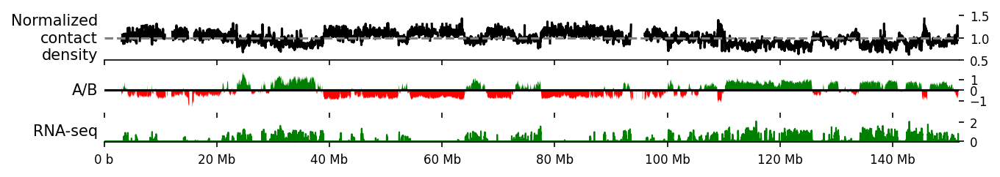

nanog


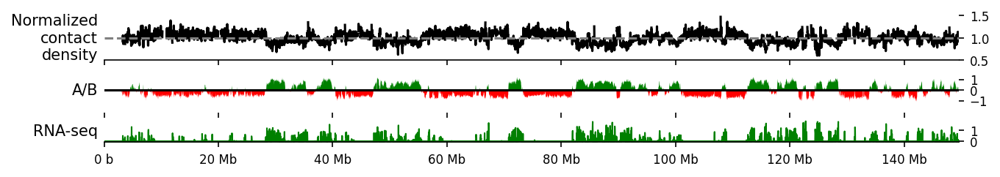

sox2


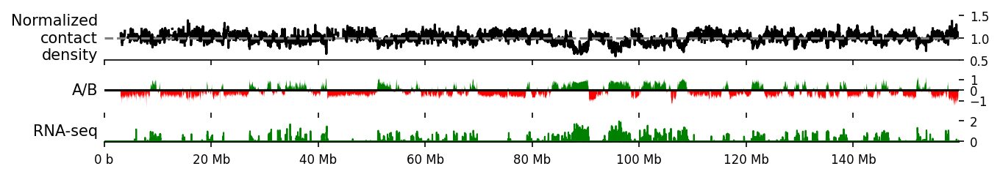

fbn2


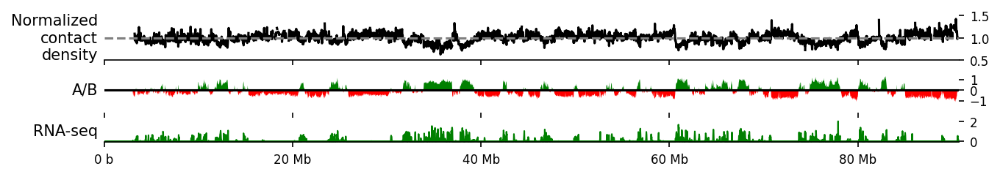

klf1


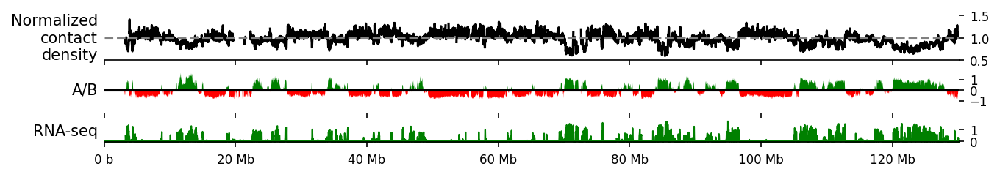

In [6]:
def epigenetics_plot(x, metrics, tracks, chrom=None, start=None, end=None, smoothing=200, bin=True, ylims=None, width=20,
                     track_height=1.0, metric_height=1.0):
    height_ratios = [metric_height]*len(metrics)
    height_ratios += [track_height]*len(tracks)
    f, axs = plt.subplots(len(height_ratios), figsize=(width, sum(height_ratios)), sharex='col',
                          gridspec_kw={'height_ratios': height_ratios})

    def format_ylabel(ax, name):
        # ax.set_ylabel(name, rotation=0, ha='left', labelpad=-10,
        #               bbox=dict(facecolor='white', edgecolor='none', alpha=0.5))
        #ax.set_ylabel(name, rotation=0, ha='right', va='center')
        ax.set_ylabel(name.replace(' ', '\n'), rotation=0, ha='right', va='center')
    
        #ax.yaxis.tick_right()
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.yaxis.tick_right()
        #ax.spines['left'].set_visible(False)

    
    for i, (name, metric) in enumerate(metrics.items()):
        ax = axs[i]
        
        if name == 'A/B':
            ax.fill_between(x, 0, np.maximum(0, metric), color='green', edgecolor='none')
            ax.fill_between(x, 0, np.minimum(0, metric), color='red', edgecolor='none')
            ax.axhline(0, c='k')
            ax.spines['bottom'].set_visible(False)
            ax.set_ylim(-2.1, 2.1)
            ax.set_yticks([-1, 0, 1])
        elif name == 'Normalized\ncontact\ndensity':
            ax.plot(x, metric, c='black')
            ax.axhline(1, c='gray', ls='--')
        else:
            ax.fill_between(x, 0, metric, color='green', edgecolor='none')
            ax.set_ylim(0)
        format_ylabel(ax, name)
            

    for i, (name, vals) in enumerate(tracks.items()):
        ax = axs[i+len(metrics)]
        ax.fill_between(x, np.zeros(vals.shape), vals, color='green')
        format_ylabel(ax, name)
        if ylims is not None and name in ylims:
            ax.set_ylim(*ylims[name])
        ax.set_xlim((start, end))
        
    axs[-1].set_xlim((start, end))
    format_ticks(axs[0], y=False)
    return f, axs

for region_name, analyzer in analyzers.items():
    print(region_name)
    density = analyzer.total_neighbor_coverage.copy()
    density[analyzer.mask] = np.nan
    density[analyzer.total_raw_coverage < 10_000] = np.nan

    metrics = {'Normalized\ncontact\ndensity': density}
    metrics['Normalized\ncontact\ndensity'] /= np.nanmedian(metrics['Normalized\ncontact\ndensity'])
    metrics['A/B'] = analyzer.compartment_scores
    supercloud = '/home/joepaggi/orcd/pool'
    track_vals = {'RNA-seq': np.log10(1 + analyzer.get_track(f'{supercloud}/omics/genomics_data/GSE123636_C59_1_2_RNAseq_coverage.mm39.bw'))}
    f, ax = epigenetics_plot(analyzer.x(), metrics, track_vals, width=10, start=analyzer.start, end=analyzer.end,
                             track_height=0.3, metric_height=0.6)
    ax[0].set_ylim(0.5, 1.5)
    plt.savefig(f'img/gw_epigenetics_abonly_{region_name}.pdf')
    plt.show()

# P(s) curves for A/B compartments

ppm1g


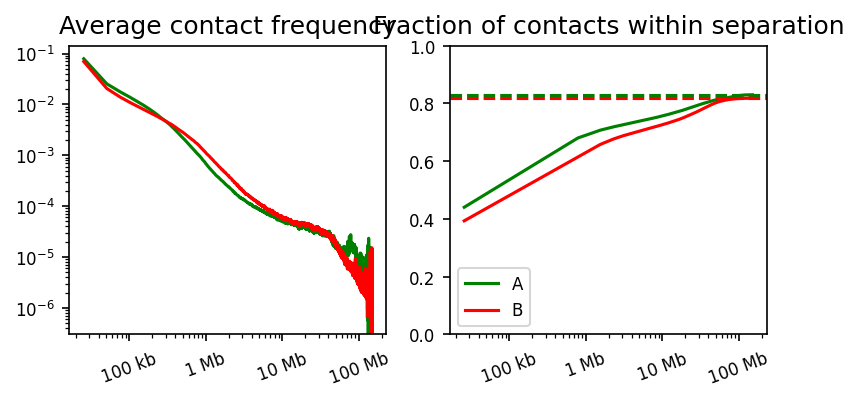

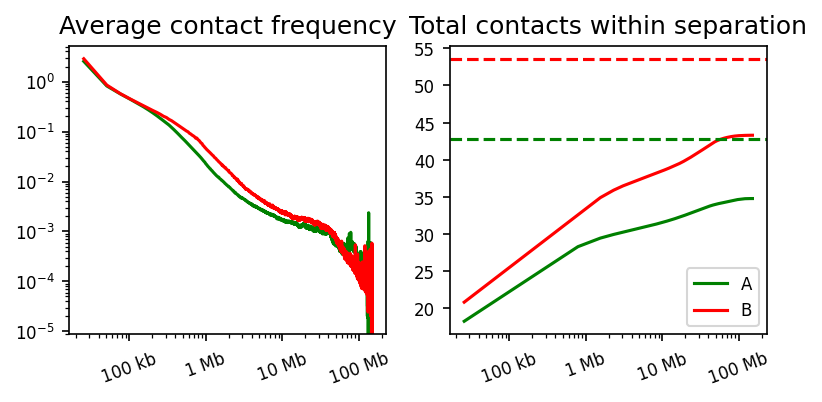

nanog


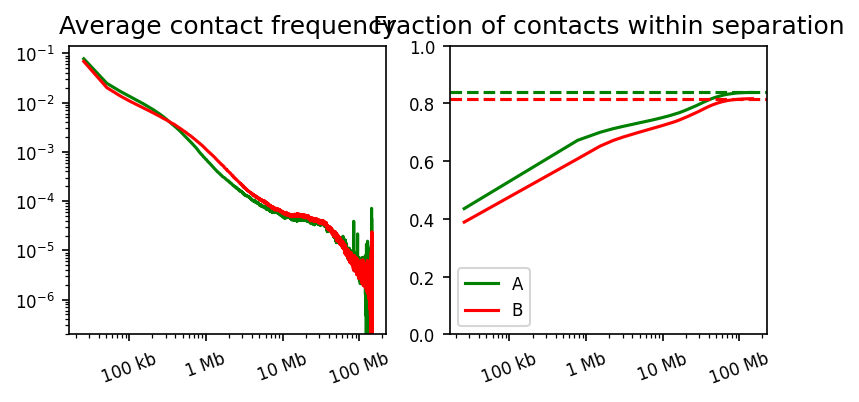

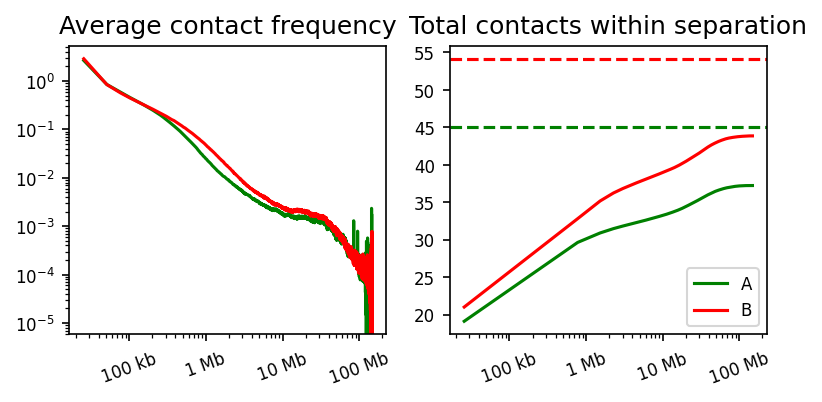

sox2


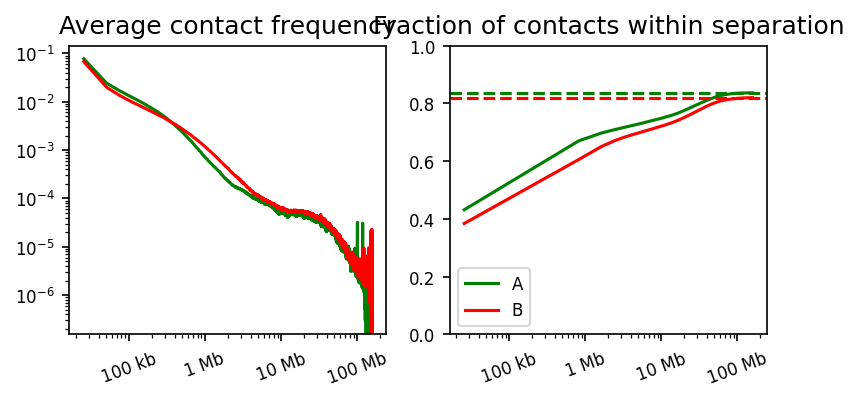

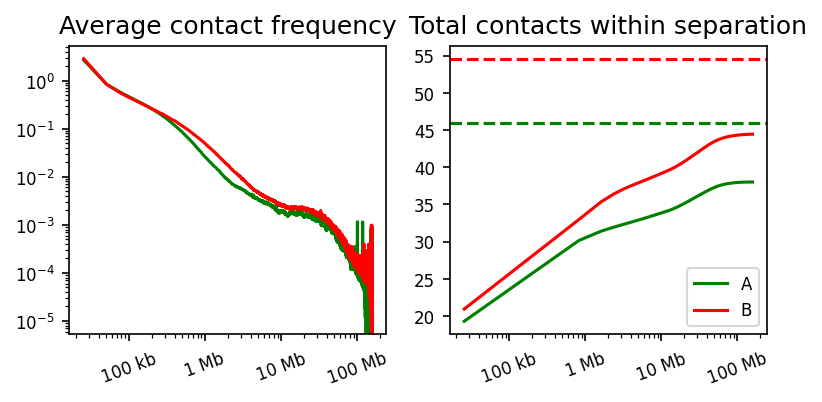

fbn2


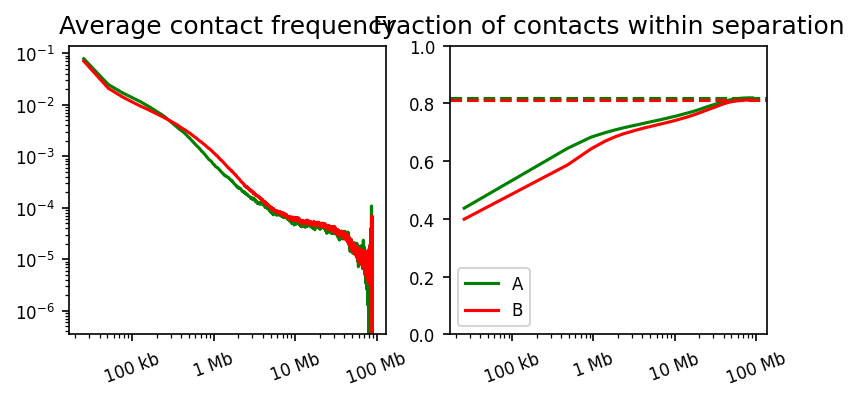

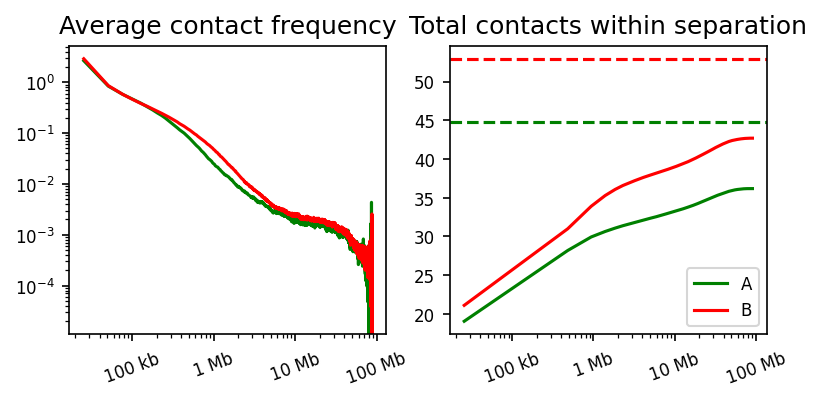

klf1


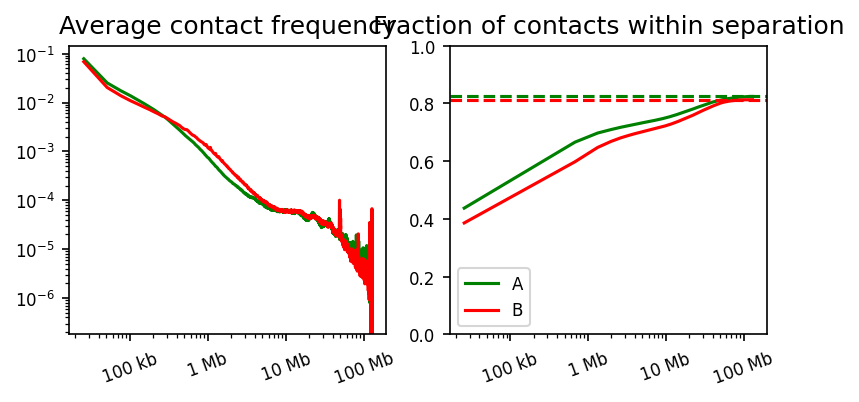

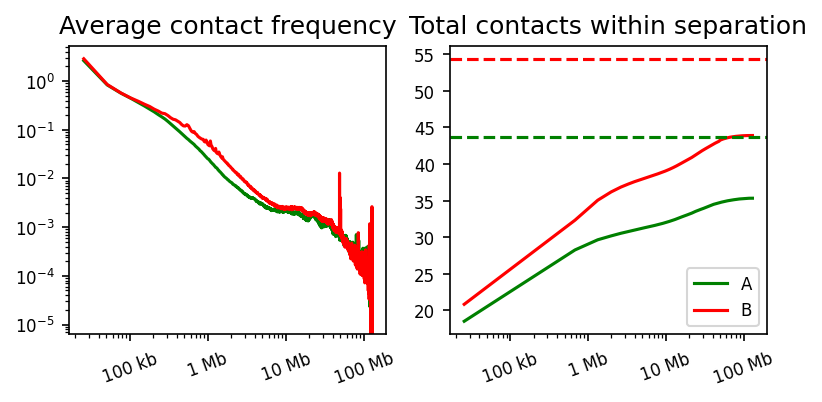

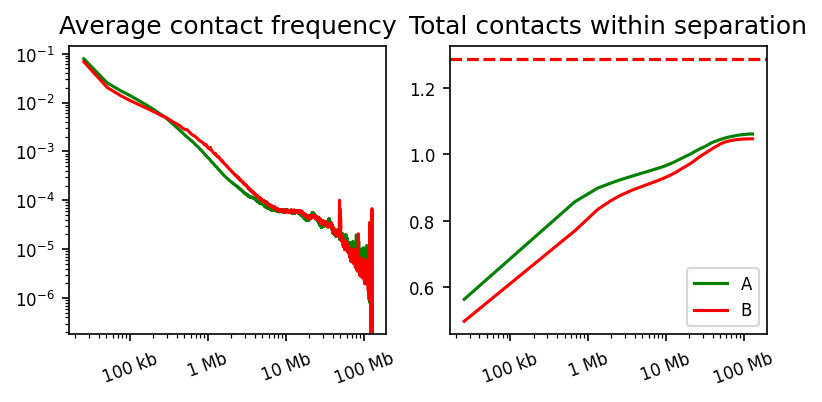

In [11]:
for region_name, analyzer in analyzers.items():
    print(region_name)
    analyzer.plot_fraction_contacts()
    plt.savefig(f'img/gw_fraction_contacts_{region_name}.pdf')
    plt.show()

    analyzer.plot_total_contacts(neighbor=True)
    plt.savefig(f'img/gw_total_contacts_{region_name}.pdf')
    plt.show()
    
# Just as a sanity check.
# These should sum to have the same value between A and B compartments at the end.
# Previously, I wasn't using ignore-diags = 0 when running ICE and this was not true.
analyzer.plot_total_contacts()
plt.show()